In [36]:
# library(caper)
library(phytools)
library(tidyr)
library(dplyr)
library(ape)
library(glue)

In [41]:
tree_path = "../../../data/statistical_analysis/species_level/traits_tree.nwk"
data_path = "../../../data/statistical_analysis/species_level/traits_data_for_phylo_analysis.csv"

# load data

In [42]:
tree = read.tree(tree_path)
data = read.csv(data_path)
data[data == ''] = NA
rownames(data) = data$Plant

# plot traits onto tree

In [53]:
par(fg="black")

plot_cat_trait <- function(trait, tree, data)
{
    subdata = data[!is.na(data[c(trait)]),]
    subtree = drop.tip(tree,tree$tip.label[-match(subdata$Plant, tree$tip.label)])
    rownames(subdata) = subdata$Plant
    subdata = subdata %>% arrange(factor(Plant, levels = subtree$tip))
    
    x = as.factor(subdata[, c(trait)])
    names(x) = rownames(subdata)
    print(glue("# species = ", length(x)))

    all_colors = palette()[2:length(palette())]
    # cols<-setNames(all_colors[1:length(unique(x))],sort(unique(x)))
    cols = c("Unrestrictive"="#61D04F", "Restrictive"="#DF536B")
    plotTree(subtree,fsize=0.1,ftype="off", outline=FALSE, type="fan")
    labels = to.matrix(x, sort(unique(x)))
    tiplabels(pie=labels, piecol=cols, cex=1) #, text=rownames(labels))
    add.simmap.legend(colors=cols,prompt=FALSE,x=0.9*par()$usr[1],y=-max(nodeHeights(subtree))+10*length(unique(x)),fsize=1.2)
}

plot_cont_trait <- function(trait, tree, data)
{

    subdata = data[!is.na(data[c(trait)]),]
    subtree = drop.tip(tree,tree$tip.label[-match(subdata$Plant, tree$tip.label)])
    rownames(subdata) = subdata$Plant
    subdata = subdata %>% arrange(factor(Plant, levels = subtree$tip))
    
    x = as.factor(subdata[, c(trait)])
    names(x) = rownames(subdata)  
    print(glue("# species = ", length(x)))
    
    obj<-contMap(subtree,x,plot=FALSE)
    obj<-setMap(obj,invert=TRUE)
    plot(obj,type="fan",ftype="off",lwd=c(2,6),outline=FALSE,xlim=c(-1.3,1.3))
}

## plot by family

# species = 1536


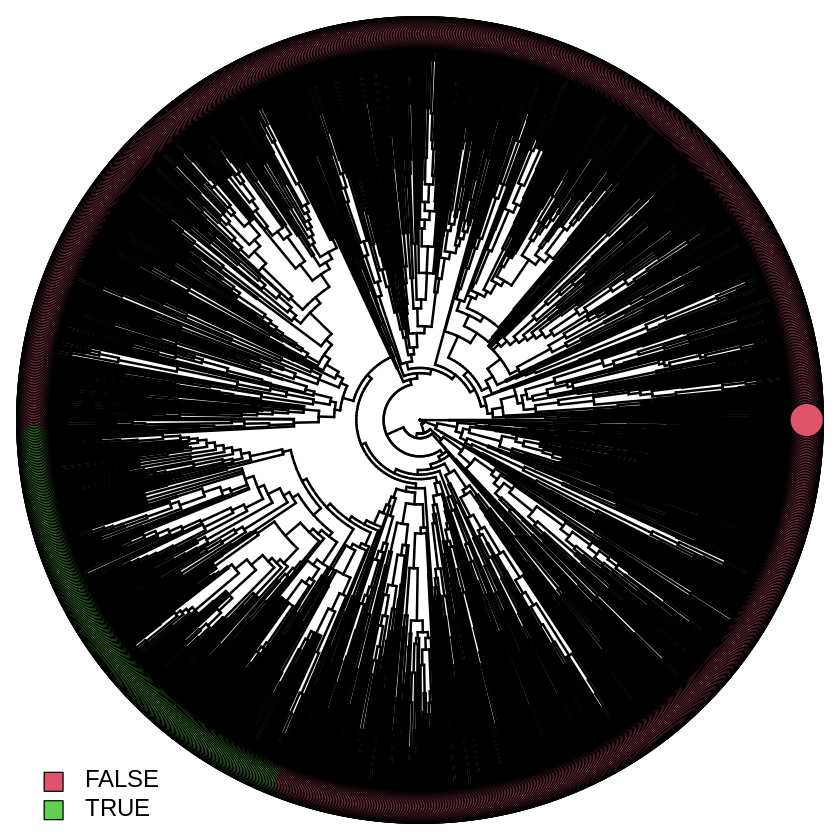

In [219]:
data$is_asteraceae = data$Family == "asteraceae"
x = plot_cat_trait(trait="is_asteraceae", data=data, tree=tree)

## general traits

### mating system

# species = 342


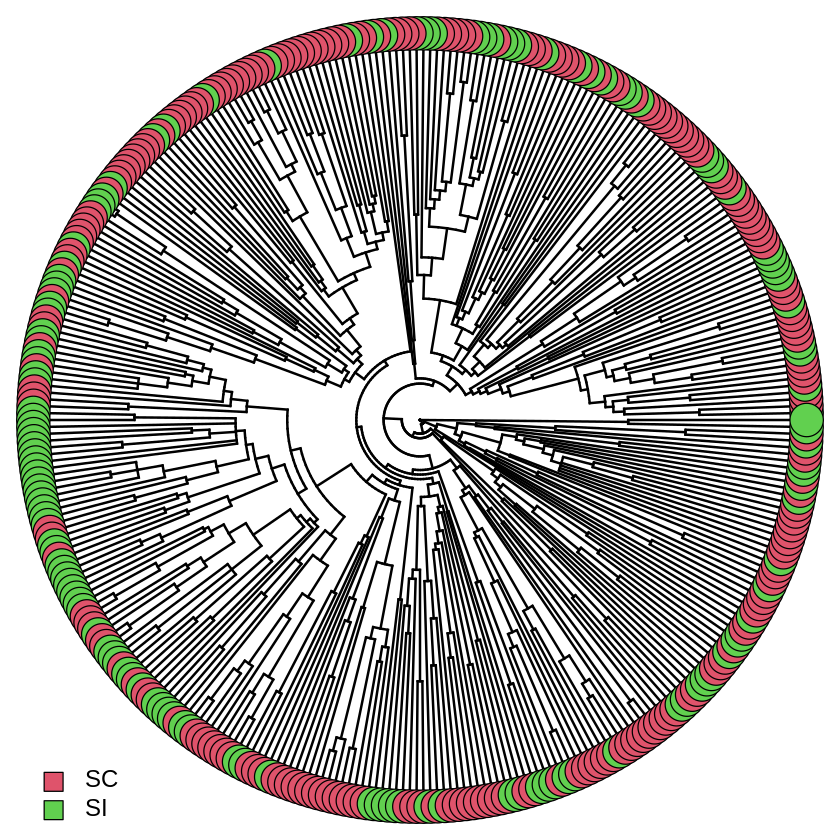

In [44]:
data[data == 'partially_SC'] = 'SC'
data[data == "unknown"] = NA
plot_cat_trait(trait="mating_system", data=data, tree=tree)

### growth form

# species = 1070


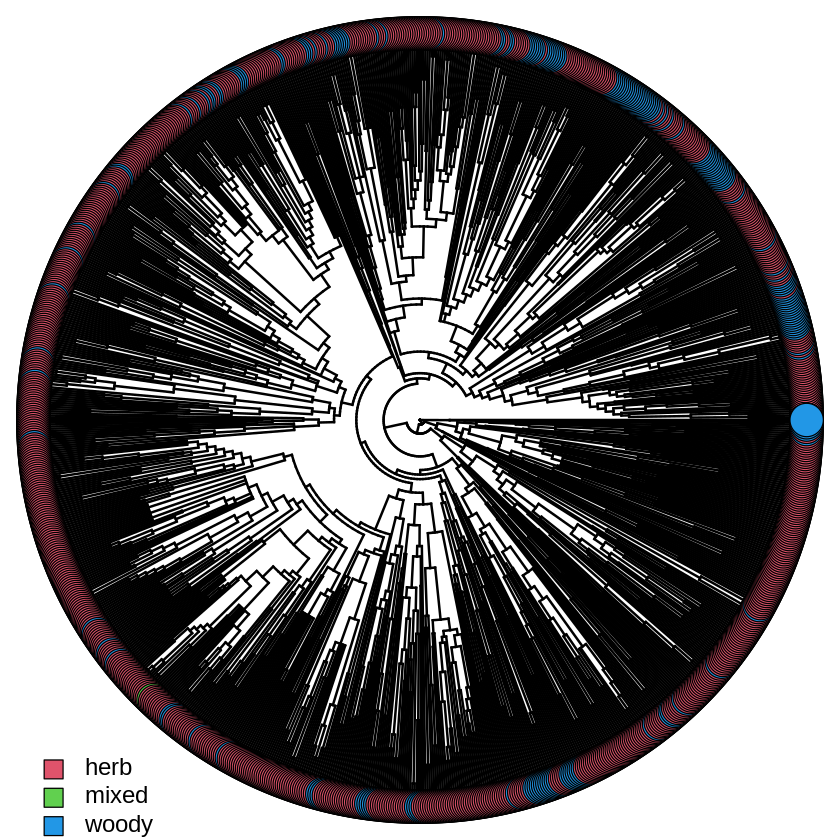

In [8]:
data[data == "conflict"] = NA
plot_cat_trait(trait="Growth_form", data=data, tree=tree)

### life cycle

# species = 1070


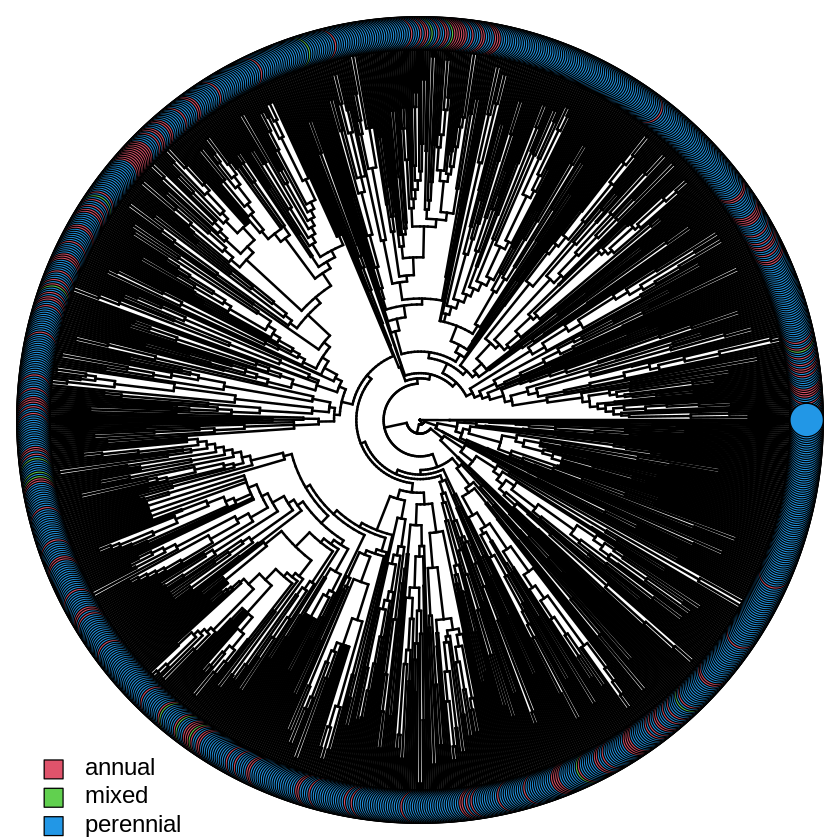

In [9]:
data[data == "conflict"] = NA
data[data == "biennial"] = NA
plot_cat_trait(trait="LifeCycle", data=data, tree=tree)

### life form

# species = 1007


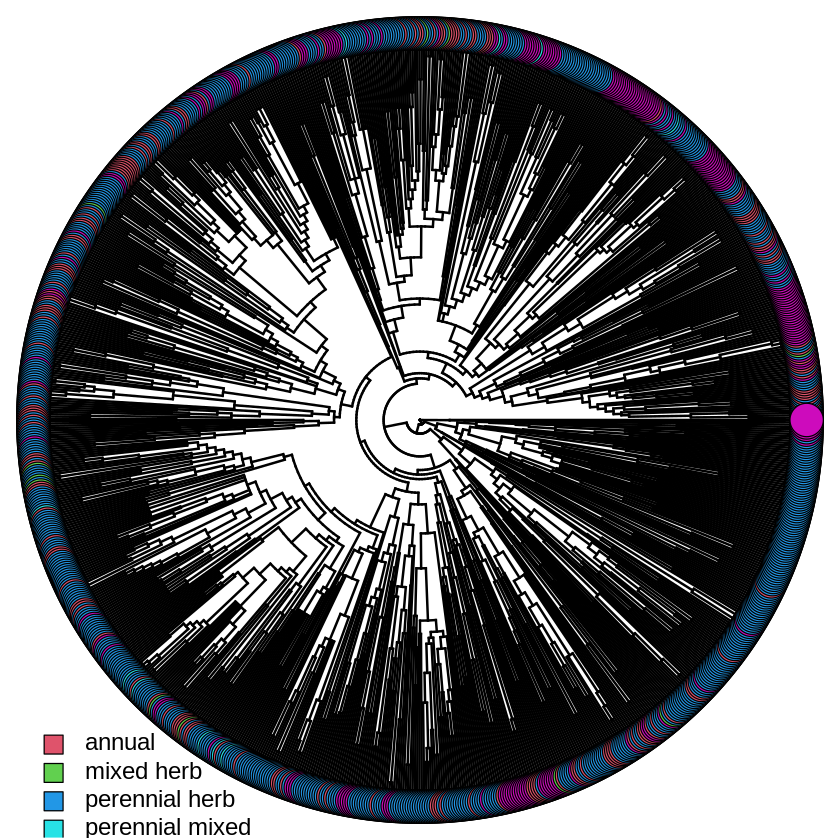

In [10]:
data[data == "perennial_herb"] = "perennial herb"
data[data == "unclassified herb"] = NA
data[data == "unclassified_perennial"] = NA
plot_cat_trait(trait="Lifeform", data=data, tree=tree)

## head-based traits

### flower symmetry

# species = 1069


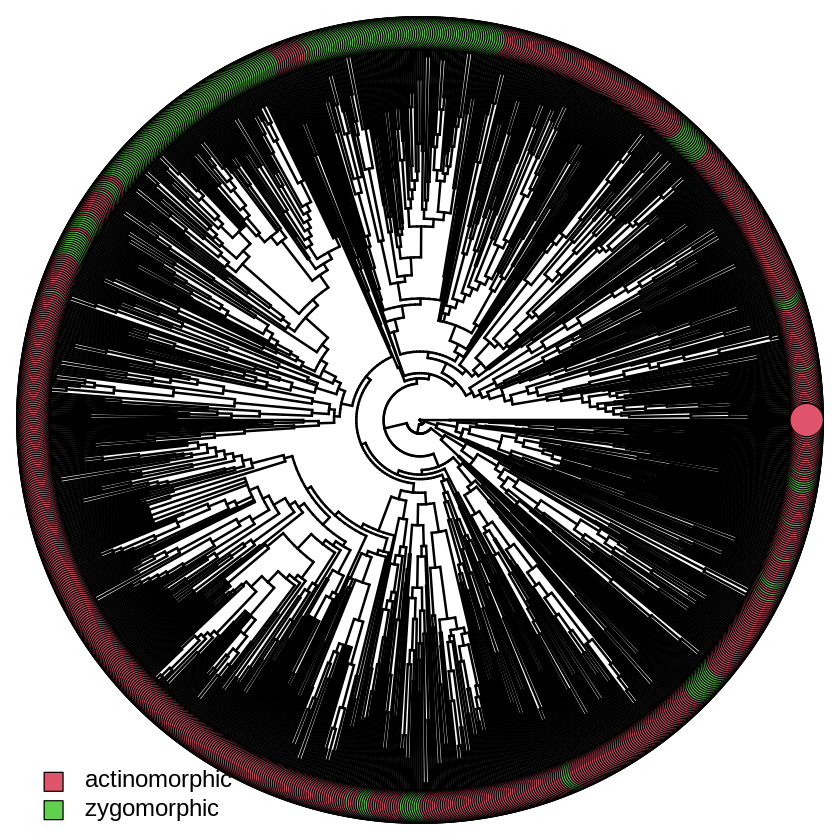

In [11]:
plot_cat_trait(trait="flw_symmetry_AST_head_level", data=data, tree=tree)

### flower shape

# species = 868


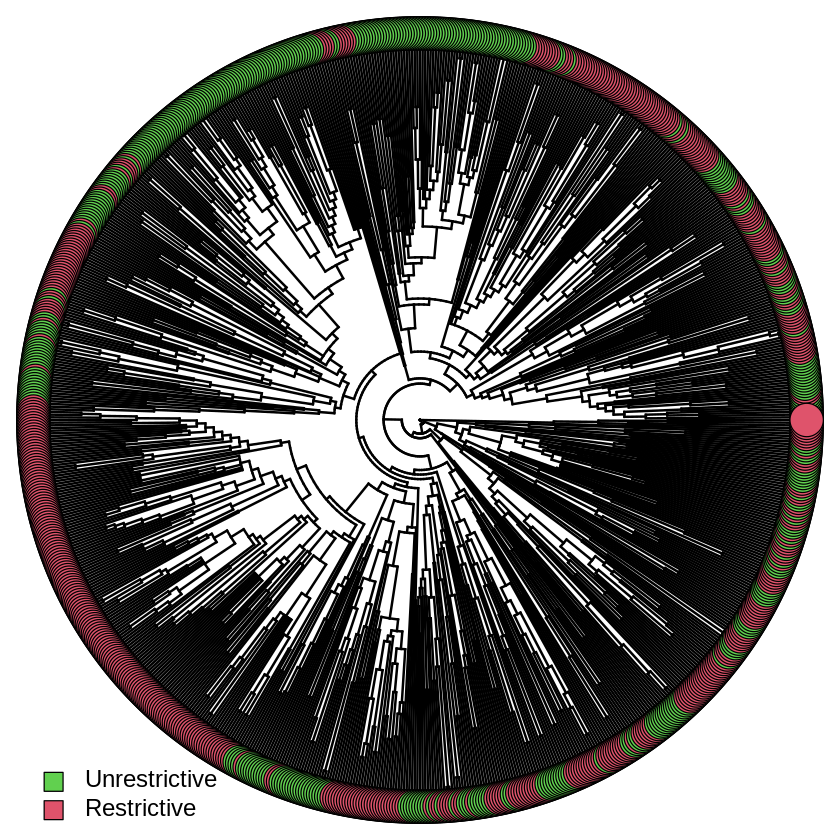

In [55]:
plot_cat_trait(trait="flw_shape_AST_head_level", data=data, tree=tree)

### number of inflorescense

# species = 1447


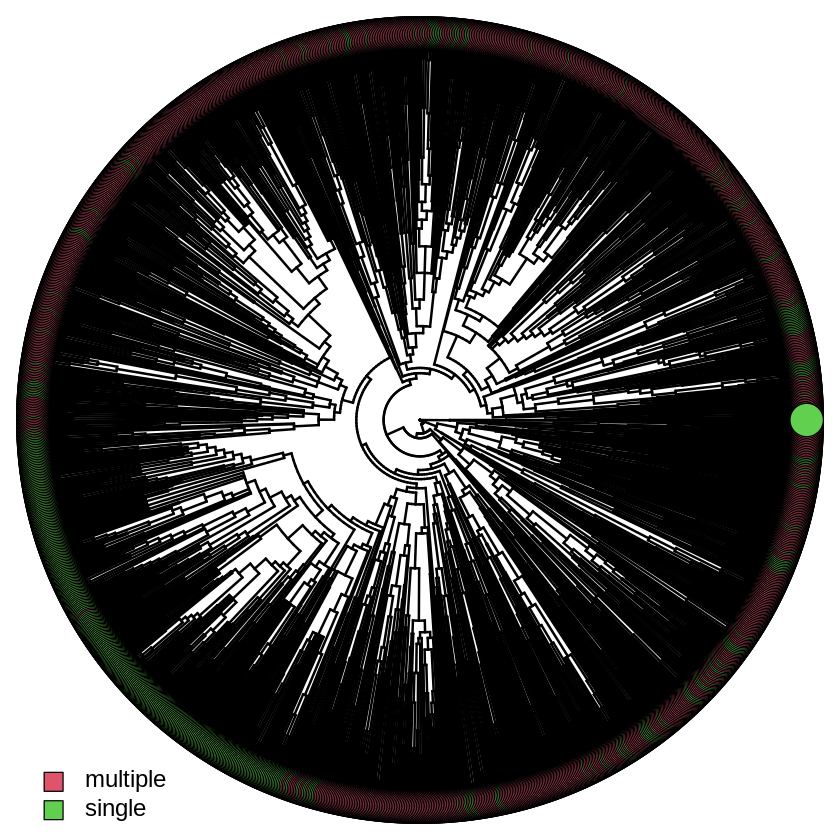

In [15]:
plot_cat_trait(trait="n_flw_infl_AST_head_level", data=data, tree=tree)

### mean flower length

# species = 1120


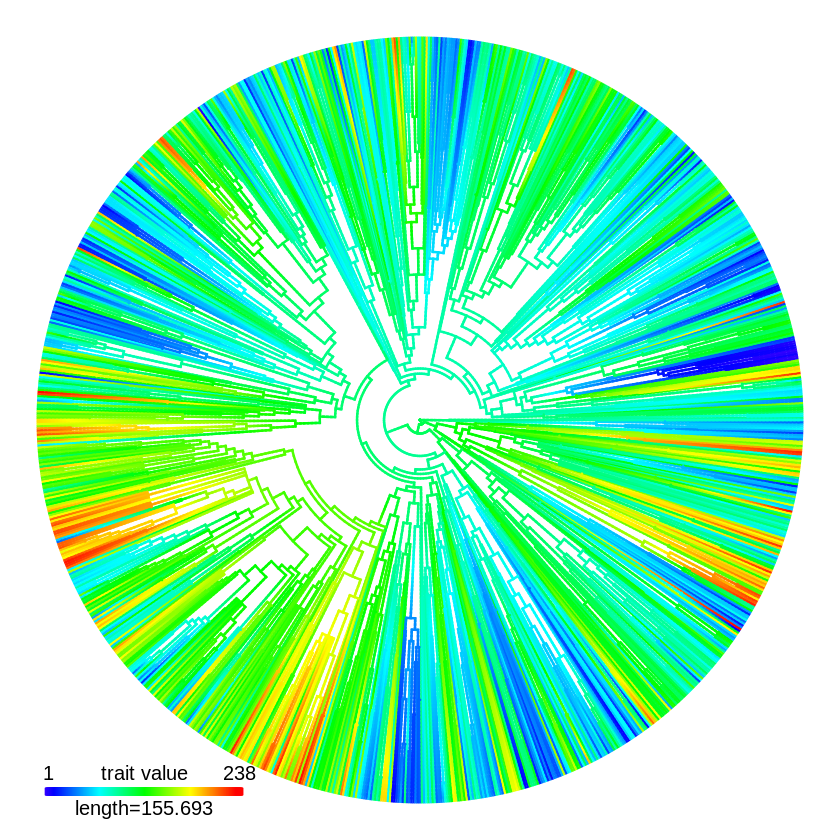

In [227]:
plot_cont_trait(trait="flw_len_mean_AST_head_level", data=data, tree=tree)

## floret-based traits

### flower symmetry

# species = 1427


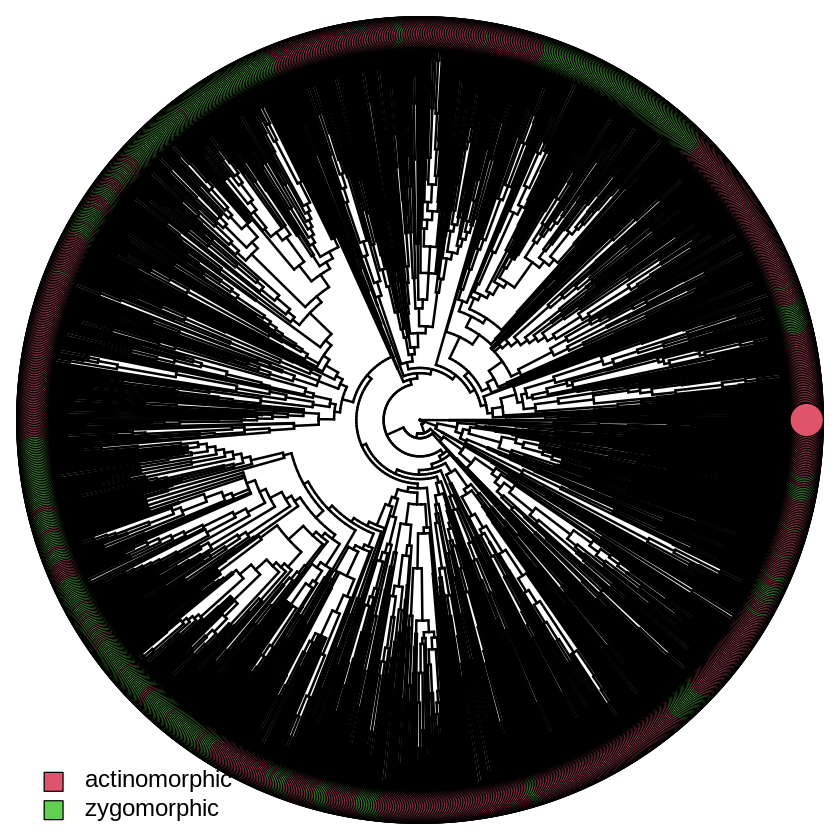

In [228]:
plot_cat_trait(trait="flw_symmetry_AST_floret_level", data=data, tree=tree)

In [239]:
# data[data$Family == "asteraceae",c("flw_symmetry_AST_floret_level", "flw_symmetry_AST_head_level")]

### flower shape

# species = 729


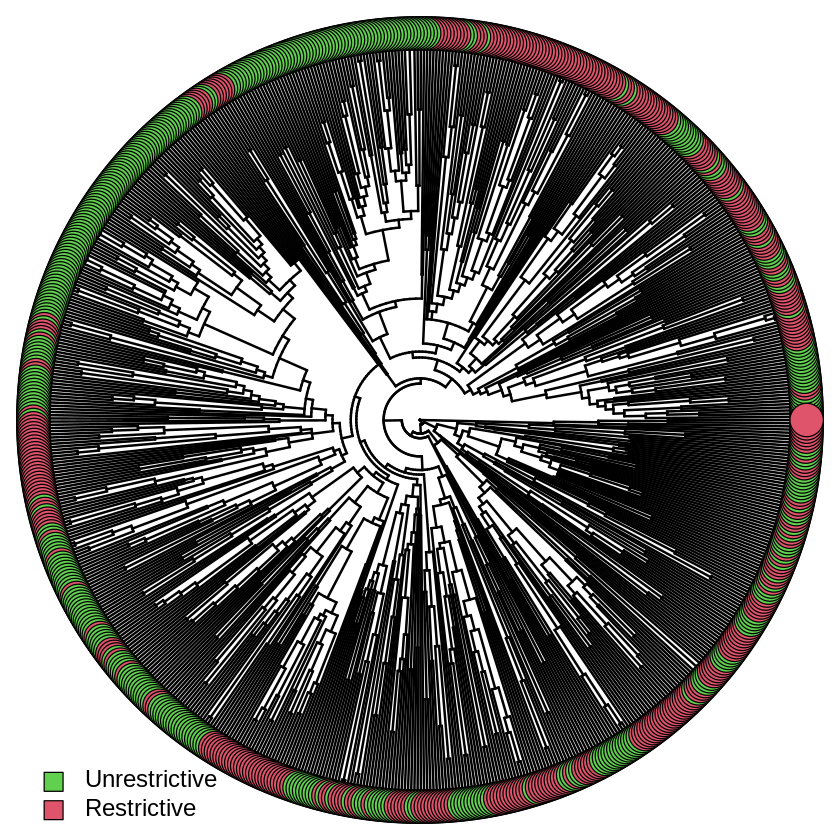

In [54]:
plot_cat_trait(trait="flw_shape_AST_floret_level", data=data, tree=tree)

## number of inflorescense

# species = 1447


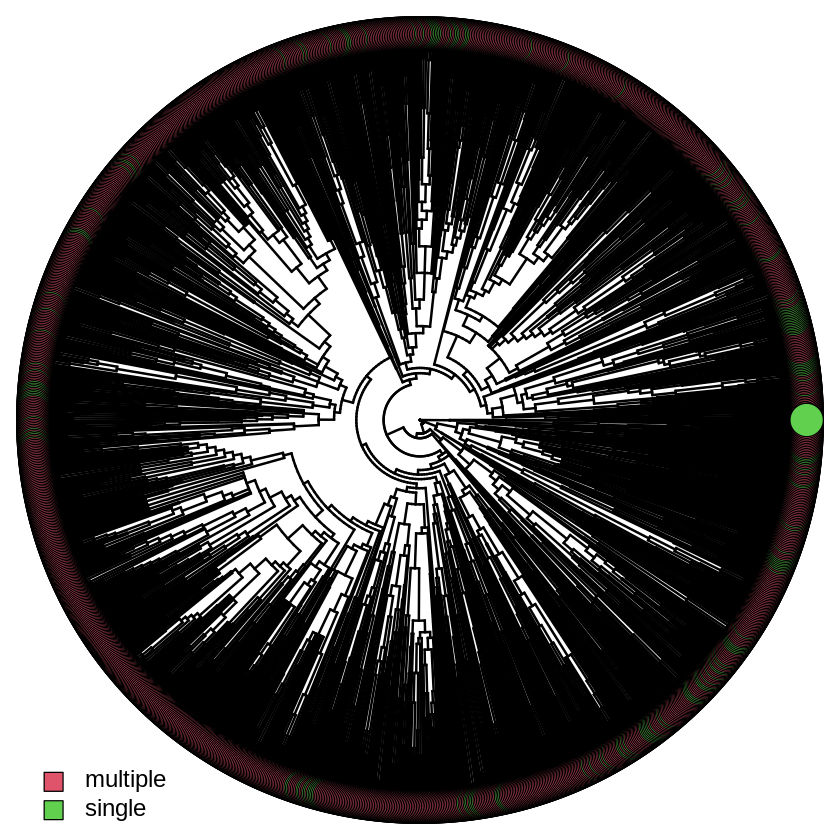

In [16]:
plot_cat_trait(trait="n_flw_infl_AST_floret_level", data=data, tree=tree)

### mean flower length

# species = 1111


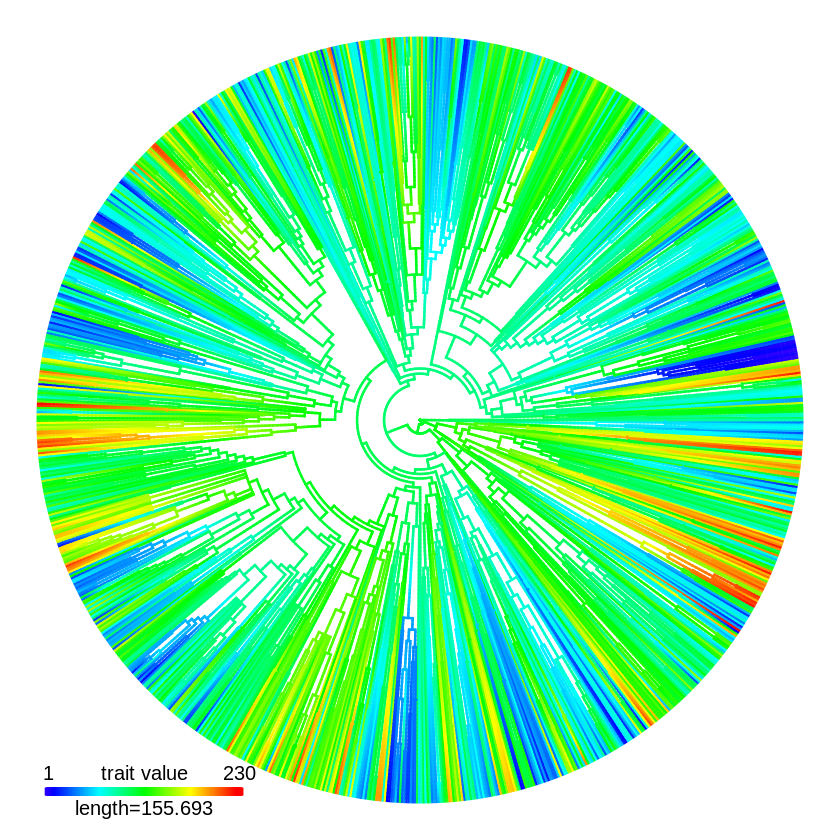

In [230]:
plot_cont_trait(trait="flw_len_mean_AST_floret_level", data=data, tree=tree)

## ploidy level

# species = 946


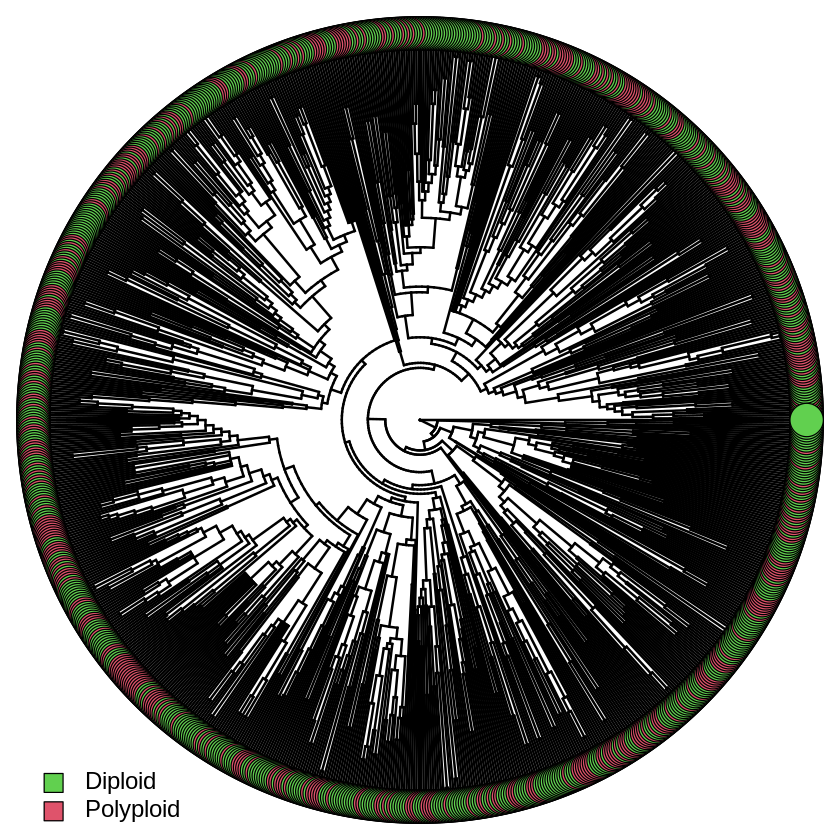

In [52]:
data["ploidy_level"] = ifelse(data$is_polyploid, "Polyploid", "Diploid")
plot_cat_trait(trait="ploidy_level", data=data, tree=tree)